In [21]:
from typing import List, Dict
import torch

import sys 
sys.path.append(".")
sys.path.append("..")

from pipeline_attend_and_excite import AttendAndExcitePipeline
from config import RunConfig
from run import run_on_prompt
import vis_utils
from vis_utils import get_token_indices
from ptp_utils import AttentionStore

%load_ext autoreload 
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load Model Weights

In [22]:
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
stable = AttendAndExcitePipeline.from_pretrained("stabilityai/stable-diffusion-2-1-base").to(device)
tokenizer = stable.tokenizer

/home/jingzhang/miniconda3/envs/ldm/lib/python3.8/site-packages/huggingface_hub/file_download.py:943: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
text_encoder/pytorch_model.fp16.safetensors not found


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/home/jingzhang/miniconda3/envs/ldm/lib/python3.8/site-packages/transformers/modeling_utils.py:415: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(checkpoin

In [23]:
# configurable parameters (see RunConfig for all parameters)
# scale factor- intensity of shift by gradient
# thresholds- a dictionary for iterative refinement mapping the iteration number to the attention threshold
# max_iter_to_alter- maximal inference timestep to apply Attend-and-Excite
def run_and_display(prompts: List[str],
                    controller: AttentionStore,
                    indices_to_alter: List[int],
                    generator: torch.Generator,
                    run_standard_sd: bool = False,
                    scale_factor: int = 20,
                    thresholds: Dict[int, float] = {0: 0.05, 10: 0.5, 20: 0.8},
                    max_iter_to_alter: int = 25,
                    display_output: bool = False):
    config = RunConfig(prompt=prompts[0],
                       run_standard_sd=run_standard_sd,
                       scale_factor=scale_factor,
                       thresholds=thresholds,
                       max_iter_to_alter=max_iter_to_alter)
    image = run_on_prompt(model=stable,
                          prompt=prompts,
                          controller=controller,
                          token_indices=indices_to_alter,
                          seed=generator,
                          config=config)
    if display_output:
        display(image)
    return image

In [24]:
import json

def build_prompt(class_name, concepts):
    concept_str = ", ".join(concepts[:-1]) + f", and {concepts[-1]}"
    return f"A photo of a {class_name} with its {concept_str}"



# prompt = "A photo of cat with its whiskers , ears , and eyes"
# concepts = ["whiskers", "ears", "eyes"]
# class_name = "cat"

# token_indices = get_token_indices(prompt, concepts, tokenizer)
# print(token_indices)

  0%|          | 0/50 [00:00<?, ?it/s]

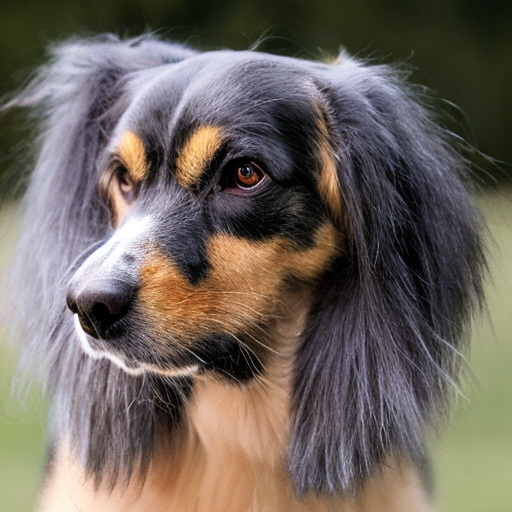

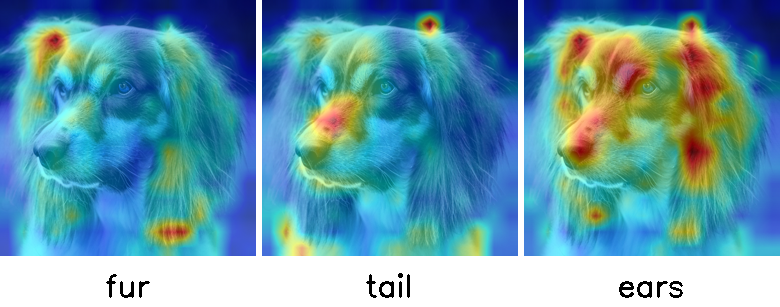

  0%|          | 0/50 [00:00<?, ?it/s]

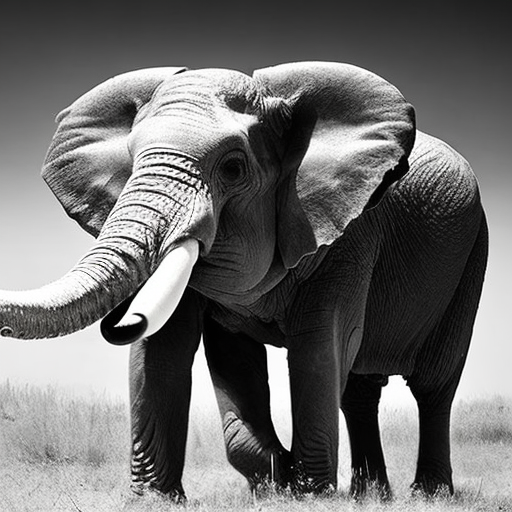

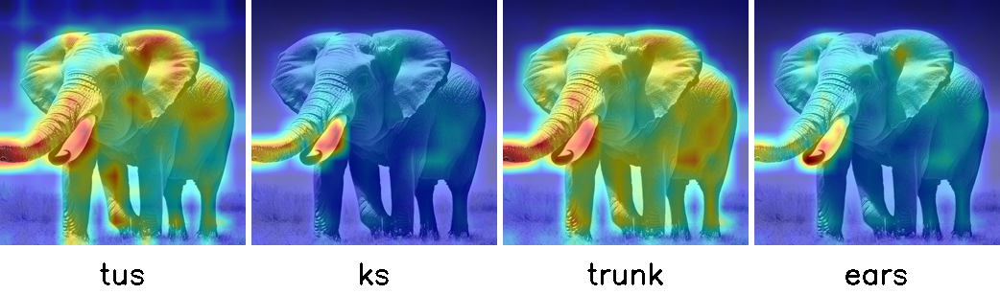

  0%|          | 0/50 [00:00<?, ?it/s]

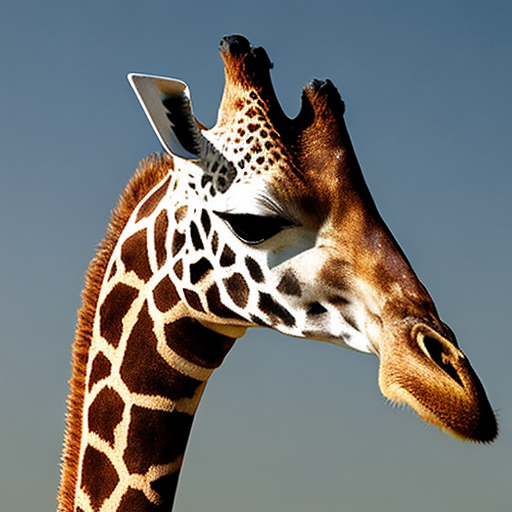

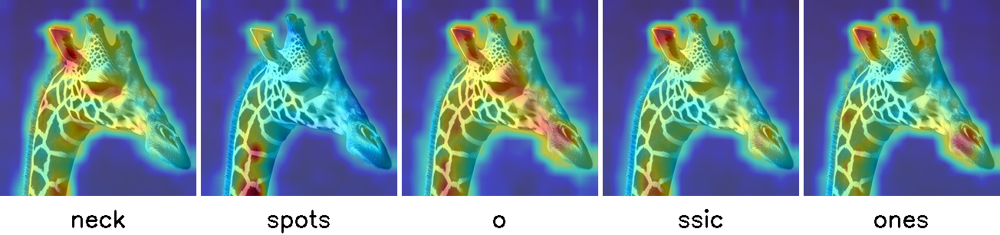

  0%|          | 0/50 [00:00<?, ?it/s]

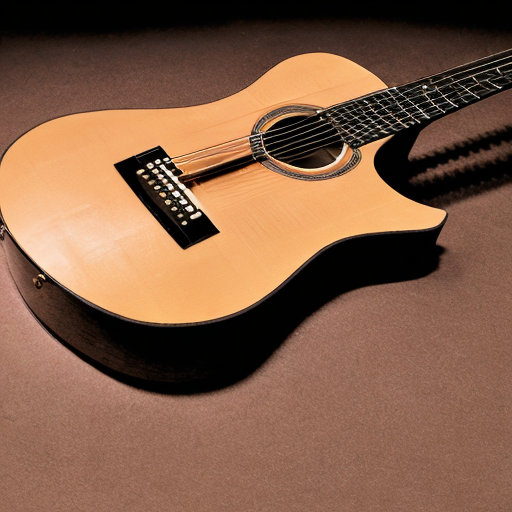

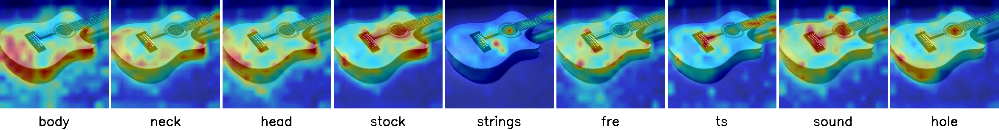

  0%|          | 0/50 [00:00<?, ?it/s]

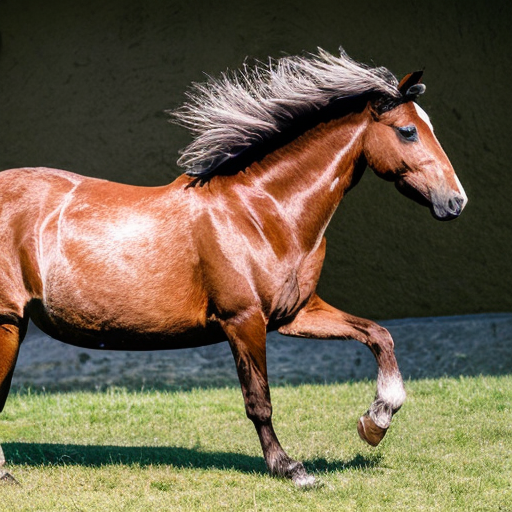

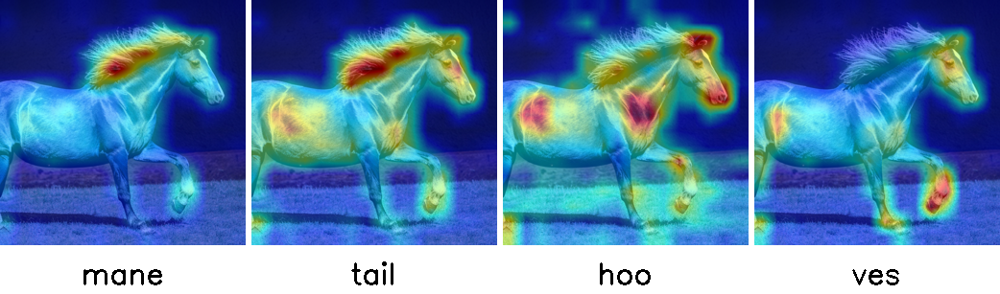

  0%|          | 0/50 [00:00<?, ?it/s]

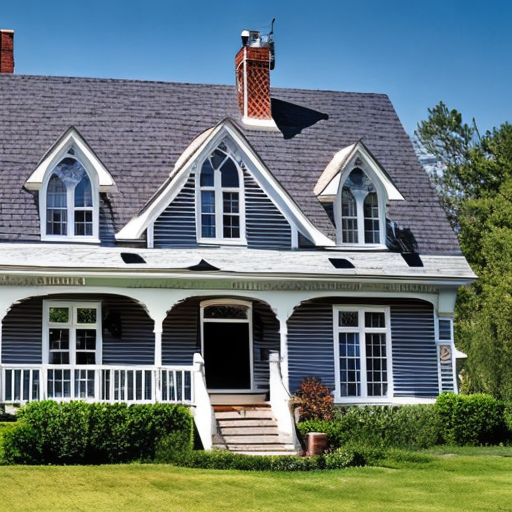

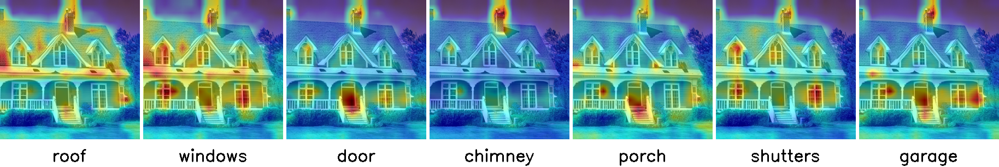

  0%|          | 0/50 [00:00<?, ?it/s]

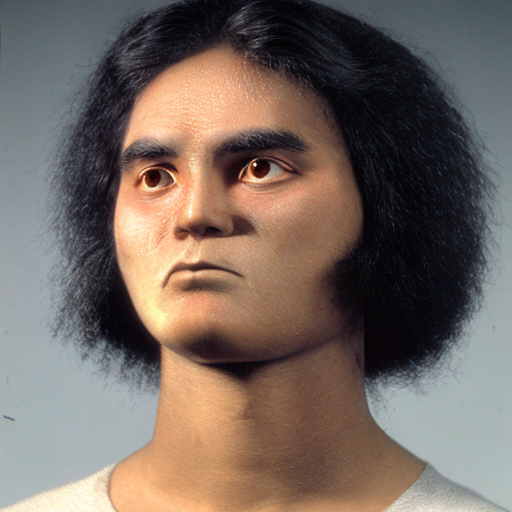

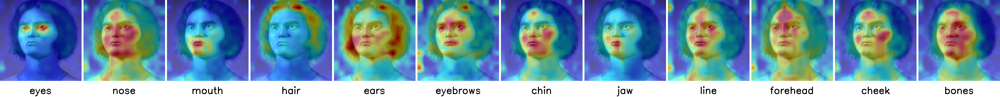

In [31]:
import os
seeds = [21]
project_root = os.path.dirname(os.getcwd())
json_path = json_path = os.path.join(project_root, "concepts", "pacs_concepts.json")
with open(json_path, "r") as f:
    class_concepts = json.load(f)

for class_name, concepts in class_concepts.items():
    prompt = build_prompt(class_name, concepts)
    token_indices = get_token_indices(prompt, concepts, tokenizer)


    for seed in seeds:
        g = torch.Generator('cuda').manual_seed(seed)
        prompts = [prompt]
        controller = AttentionStore()
        image = run_and_display(prompts=prompts,
                                controller=controller,
                                indices_to_alter=token_indices,
                                generator=g,
                                run_standard_sd=True,
                                display_output=True)
        vis_utils.show_cross_attention(attention_store=controller,
                                    prompt=prompt,
                                    class_name=class_name,
                                    tokenizer=tokenizer,
                                    res=16,
                                    from_where=("up", "down", "mid"),
                                    indices_to_alter=token_indices,
                                    orig_image=image)